In [1]:
%load_ext autoreload 
%autoreload 2

# Example notebook for DIP ptycho of the MOSS-6 dataset 

To be used with the `diffractive_imaging` branch of quantEM. 

[Data available](https://zenodo.org/records/13958144) from the [paper](https://www.nature.com/articles/s41467-025-56215-z#data-availability). 

Arthur McCray, Georgios Varnavides  
Last remembered to update this line: 11/19/25

In [2]:
from pathlib import Path

import numpy as np
import torch

import quantem as em
from quantem.core import config
from quantem.core.datastructures import Dataset4dstem
from quantem.core.ml import CNN2d
from quantem.core.visualization import show_2d
from quantem.core.utils.diffractive_imaging_utils import fit_probe_circle

from quantem.diffractive_imaging import (
    PtychographyDatasetRaster,
    DetectorPixelated,
    ObjectDIP,
    ObjectPixelated,
    ProbeDIP,
    ProbePixelated,
    Ptychography,
    DirectPtychography,
)

from quantem.diffractive_imaging.direct_ptychography import OptimizationParameter

# GPU_ID = 1
# config.set_device(GPU_ID)
# config.set_device("mps")
print(f"device set to {config.get("device")}")


/Users/gvarnavides/Documents/git-repos/quantem/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device set to cpu


## Import and Visualize Data

In [3]:
# fdata = Path("~/data/public_ptycho/MOSS6/2025_RawData/ExperimentalData_MOSS-6_Fig.3/scan_x256_y256.xml").expanduser()
fdata = Path("data/moss-6.xml").absolute() # rsciio requires the xml file -- silly..
dset = em.io.read_4dstem(
    fdata,
    file_type='empad'
)
dset.array = np.transpose(dset.array, (0,1,3,2)).clip(0)
dset

WARNING | RosettaSciIO | The scale of the navigation axes cannot be read. (rsciio.empad._api:160)
WARNING | RosettaSciIO | The scale of the signal axes cannot be read. (rsciio.empad._api:168)


Dataset(shape=(256, 256, 128, 128), dtype=float32, name='4D-STEM dataset')
  sampling: [1 1 1 1]
  units: ['', '', 'None', 'None']
  signal units: 'arb. units'

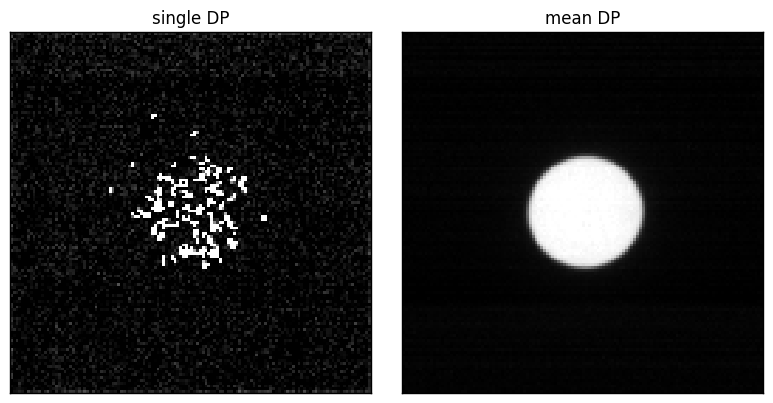

In [4]:
dset.get_dp_mean()

show_2d(
    [
        dset[0,0].array,
        dset.dp_mean,
    ],
    titles=[
        "single DP",
        "mean DP",
    ],
);

In [5]:
PROBE_ENERGY = 300e3
PROBE_SEMIANGLE = 10 # mrad 
PROBE_DEFOCUS = 885 # A 
SCAN_STEP_SIZE = 1.051 # A 

NUM_PROBES = 1 # can do mixed state but doesnt add anything, end up at 50/50 probe modes 2 
NUM_SLICES = 5 
SLICE_THICKNESS = 40 # A

In [6]:
dset.sampling = (SCAN_STEP_SIZE, SCAN_STEP_SIZE, 1, 1)
dset.origin = 0
dset.units=("A", "A", "pixels", "pixels")

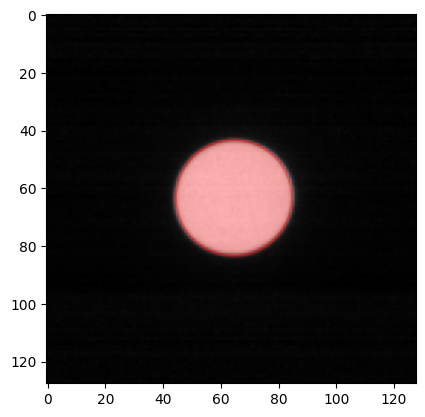

quantem Dataset named '4D-STEM dataset'
  shape: (256, 256, 128, 128)
  dtype: float32
  device: cpu
  origin: [0 0 0 0]
  sampling: [1.051      1.051      0.49534808 0.49534808]
  units: ['A', 'A', 'mrad', 'mrad']
  signal units: 'arb. units'


In [7]:
probe_qy0, probe_qx0, probe_R = fit_probe_circle(dset.dp_mean.array, show=True)
dset.sampling[2] = PROBE_SEMIANGLE / probe_R
dset.sampling[3] = PROBE_SEMIANGLE / probe_R
dset.units[2:] = ["mrad", "mrad"]
probe_R = PROBE_SEMIANGLE / dset.sampling[2]
print(dset)

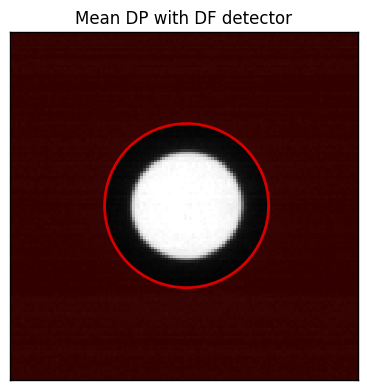

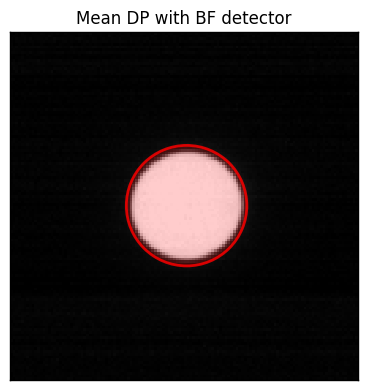

Dataset(shape=(256, 256), dtype=float32, name='BF')
  sampling: [1.051 1.051]
  units: ['A', 'A']
  signal units: 'arb. units'

In [8]:
dset.get_virtual_image(
    mode="annular",
    geometry=((probe_qy0, probe_qx0), (probe_R+10, probe_R*5)), 
    name="DF",
    show=True,
)

dset.get_virtual_image(
    mode="circle", 
    geometry=((probe_qy0, probe_qx0), probe_R+2), 
    name="BF",
    show=True,
)



(256, 256, 128, 128)


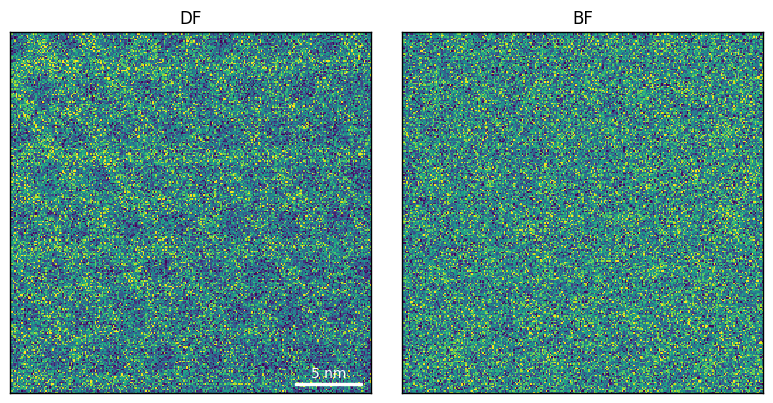

In [9]:
dset.show_virtual_images(cmap='viridis')
print(dset.shape)

## Direct Ptychography

In [10]:
direct_ptycho = DirectPtychography.from_dataset4d(
    dset,
    energy=PROBE_ENERGY,
    semiangle_cutoff=PROBE_SEMIANGLE,
    aberration_coefs={"defocus":PROBE_DEFOCUS},
    rotation_angle=np.deg2rad(90),
    fit_method='constant',
    max_batch_size=256*32,
    # device=config.device()
)

In [12]:
recons = direct_ptycho._reconstruct_all_permutations(
    max_batch_size = 256*32
)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:09<00:00,  1.58s/it]


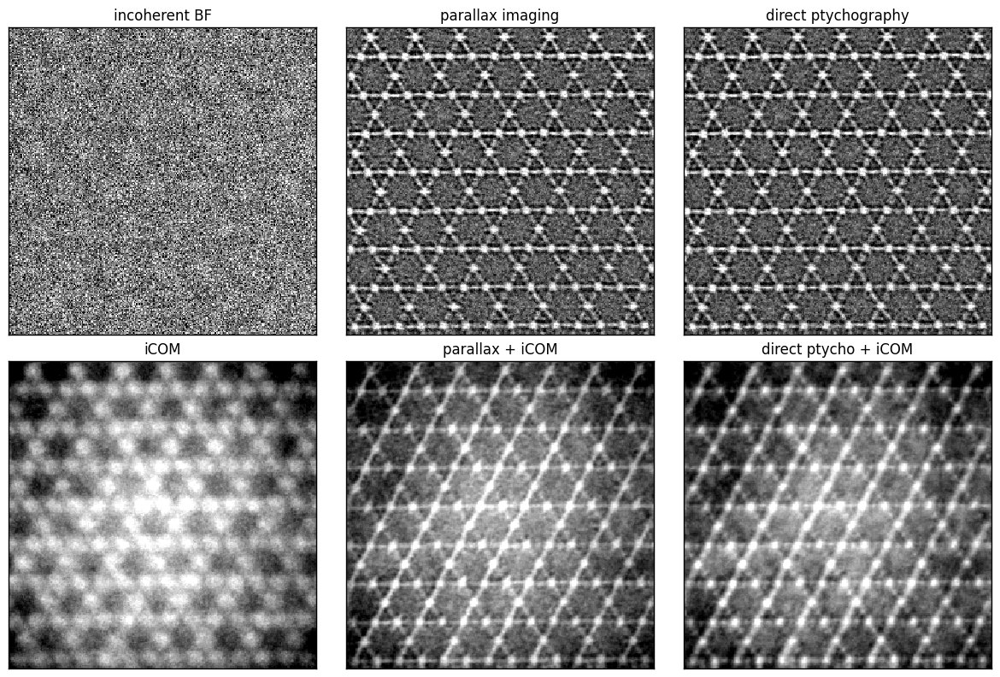

In [13]:
em.visualization.show_2d(
    [
        recons[:3],
        recons[3:],
    ],
    title=[
        ["incoherent BF","parallax imaging","direct ptychography"],
        ["iCOM","parallax + iCOM","direct ptycho + iCOM"],
    ]
);

In [14]:
direct_ptycho = direct_ptycho.optimize_hyperparameters(
    aberration_coefs={
        "C10":OptimizationParameter(
            -1.5*PROBE_DEFOCUS,
            -0.5*PROBE_DEFOCUS,
        ),
        "C12":OptimizationParameter(0,300),
        "phi12":OptimizationParameter(-np.pi/2, np.pi/2)
    },
    max_batch_size=256 * 32,
    rotation_angle=OptimizationParameter(
        direct_ptycho.rotation_angle - 0.2, 
        direct_ptycho.rotation_angle + 0.2
    ),
    deconvolution_kernel='parallax',
    n_trials=250
)

Best trial: 242. Best value: 2.51355: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [04:29<00:00,  1.08s/it]


Optimized parameters: {'C10': -1027.7183658901652, 'C12': 123.70239139667807, 'phi12': -0.4549131761611848, 'rotation_angle': 1.6414286911255453}


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1250/1250 [00:03<00:00, 370.76it/s]


(<Figure size 400x400 with 1 Axes>, <Axes: >)

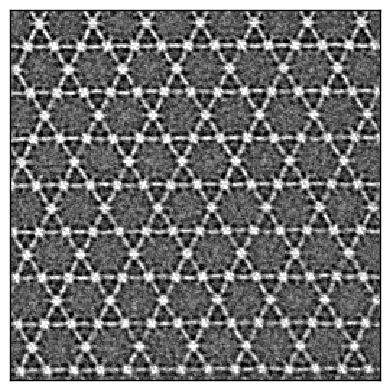

In [15]:
em.visualization.show_2d(
    direct_ptycho.reconstruct_with_optimized_parameters(
        max_batch_size=256 * 32,
        deconvolution_kernel='full',
    ).obj
)

In [16]:
optimized_aberration_coefs = direct_ptycho._optimized_parameters.copy()
optimized_rotation_angle_rad = optimized_aberration_coefs.pop("rotation_angle")
optimized_rotation_angle_deg = np.rad2deg(optimized_rotation_angle_rad)

print("optimized parameters:", optimized_aberration_coefs)
print("optimized rotation in degrees:", optimized_rotation_angle_deg)

optimized parameters: {'C10': -1027.7183658901652, 'C12': 123.70239139667807, 'phi12': -0.4549131761611848}
optimized rotation in degrees: 94.04693637317655


In [10]:
# optimized_aberration_coefs = {'C10': -1027.7183658901652, 'C12': 123.70239139667807, 'phi12': -0.4549131761611848}
# optimized_rotation_angle_deg = 94.0469

## Iterative Ptychography

In [35]:
half_thickness = SLICE_THICKNESS * (NUM_SLICES-1) / 2
optimized_aberration_coefs_iterative = optimized_aberration_coefs.copy()
optimized_aberration_coefs_iterative["C10"] -= half_thickness
optimized_aberration_coefs_iterative

{'C10': -1107.7183658901652,
 'C12': 123.70239139667807,
 'phi12': -0.4549131761611848}

Calculating center of mass: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 65536/65536 [00:03<00:00, 21248.84probe position/s]

Forcing best fit rotation to 94 degrees.
Forcing transpose of intensities to False.


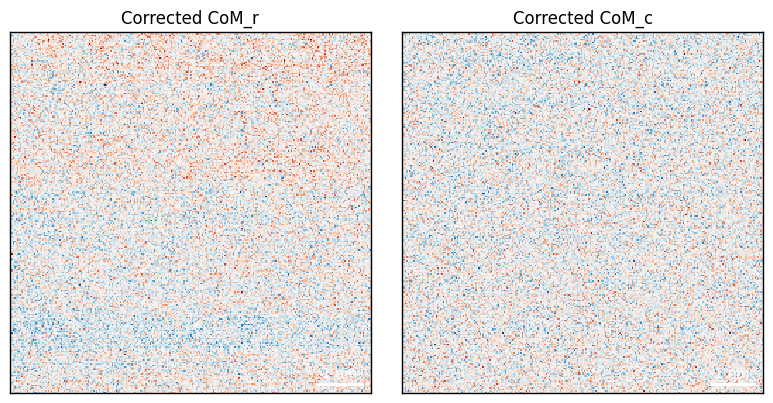

Normalizing intensities: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65536/65536 [00:35<00:00, 1872.18probe position/s]


In [11]:
pdset = PtychographyDatasetRaster.from_dataset4dstem(
    dset,
    learn_scan_positions=True,
    learn_descan=False,
)

pdset.preprocess(
    com_fit_function="constant",
    plot_rotation=True,
    plot_com=True,
    probe_energy=PROBE_ENERGY,
    force_com_rotation=optimized_rotation_angle_deg, 
    force_com_transpose=False,
    vectorized=False,
)    

### pixelated

In [36]:
obj_model_pix = ObjectPixelated.from_uniform(
    num_slices=NUM_SLICES, 
    slice_thicknesses=SLICE_THICKNESS,
    obj_type='pure_phase',
)

probe_params = {
    "energy" : PROBE_ENERGY,
    # "defocus" : PROBE_DEFOCUS,
    "aberration_coefs": optimized_aberration_coefs_iterative,
    "semiangle_cutoff" : PROBE_SEMIANGLE, 
}

probe_model_pix = ProbePixelated.from_params(
    num_probes=NUM_PROBES,
    probe_params=probe_params,
)

detector_model = DetectorPixelated() 

ptycho_pix = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
    device='cpu',
)

ptycho_pix.preprocess( 
    obj_padding_px=(32,32),
    batch_size=128,
)

In [ ]:
opt_params = {
        "object": {
            "type": "adamw", 
            "lr": 1e-3, 
        },
        "probe": {
            "type": "adamw", 
            "lr": 1e-3, 
        },
        "dataset": { ### for optimizing over descan shifts and probe positions
            "type": "adamw",
            "lr": 1e-4,
        }
}

scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
    },
    "probe": {
        "type": "plateau",
    },
    "dataset": { 
        "type": "plateau",  ## exp is also frequently used 
    }
}

constraints = {
    "object": {
        "identical_slices": True, # default for this is False 
    },
}

ptycho_pix.reconstruct(
    num_iters=20,
    reset=True,
    autograd=True, 
    device='gpu',
    constraints=constraints, 
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=128,
    store_snapshots_every=10,
).visualize(
)

  0%|          | 0/30 [00:00<?, ?it/s]

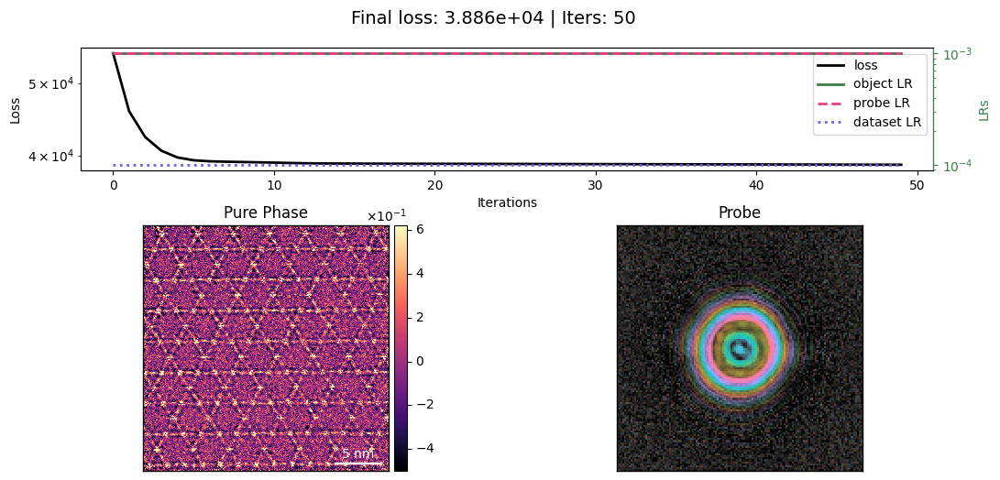

In [14]:
ptycho_pix.reconstruct(
    num_iters=30,
).visualize()


In [15]:
## additional iterations does help to a point 

# ptycho_pix.reconstruct(
#     num_iter=50,
# ).visualize()


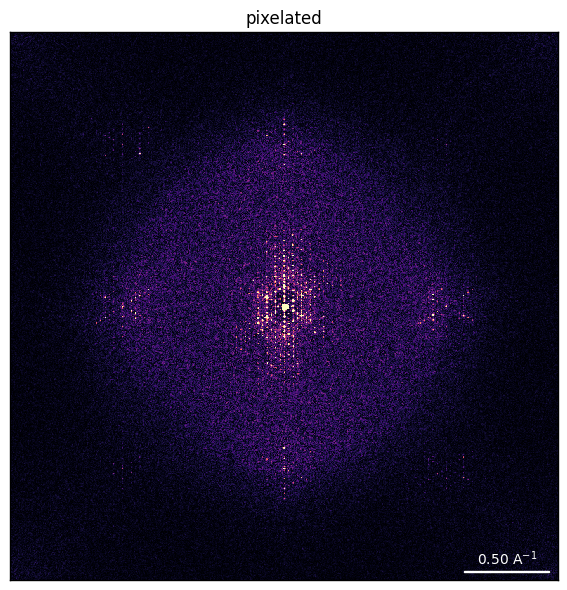

In [16]:
ptycho_pix.show_obj_fft(
    cmap="magma",
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="pixelated",
    axsize=(6, 6),
)


In [18]:
ptycho_pix.save(
    "../data/MOSS6_pix.zip",
    # mode='o',
)

Saving ptychography object to /home/amccray/code/quantem-tutorials/notebooks/../data/MOSS6_pix.zip


# DIP

In [19]:
probe_model_dummy = ProbePixelated.from_params(
    num_probes=NUM_PROBES,
    probe_params=probe_params,
)

obj_model_dummy = ObjectPixelated.from_uniform(
    num_slices=NUM_SLICES, 
    slice_thicknesses=SLICE_THICKNESS, 
    obj_type='pure_phase',
)

detector_model = DetectorPixelated() 

ptycho_dummy = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_dummy,
    probe_model=probe_model_dummy,
    detector_model=detector_model,
    device='cpu',
)

ptycho_dummy.preprocess( 
    obj_padding_px=(32,32),
    batch_size=128,
)

  0%|          | 0/150 [00:00<?, ?it/s]

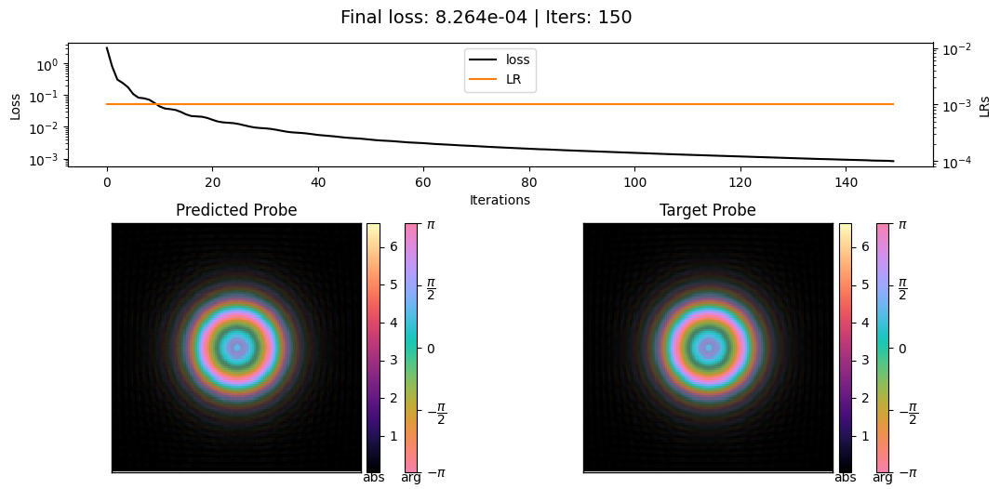

In [20]:
obj_dip = CNN2d(
    in_channels = NUM_SLICES, 
    start_filters = 16,
    num_layers = 3,
    use_skip_connections = True,
    dtype = torch.float32, # dtype float32 for pure_phase or potential, complex64 for complex
    use_batchnorm=True,
    final_activation = "identity", 
)

obj_model_dip = ObjectDIP.from_pixelated(
    model = obj_dip,
    pixelated=obj_model_pix,
    device=config.get("device"), 
)

probe_dip = CNN2d(
    in_channels=ptycho_pix.num_probes,
    start_filters=32,
    num_layers=3,
    use_skip_connections=True,
    dtype = torch.complex64,
    use_batchnorm=True,
)

probe_model_dip = ProbeDIP.from_pixelated(
    model=probe_dip,
    pixelated=ptycho_dummy.probe_model,
    device=config.get("device"),
)

pdset.learn_descan = False 
pdset.learn_scan_positions = True

### pretraining the obj model isn't necessary for this dataset 
# obj_model_dip.pretrain(
#     reset=True,
#     num_iters=50,
#     optimizer_params={
#         "type": torch.optim.Adam,
#         "lr": 1e-3,
#     },
#     scheduler_params={
#         "type": "plateau",
#         "factor": 0.5,
#     },
# )

probe_model_dip.pretrain(
    reset=True,
    num_iters=150,
    optimizer_params={
        "type": torch.optim.Adam,
        "lr": 1e-3,
    },
    scheduler_params={
        "type": "plateau",
        "factor": 0.5,
    },
    apply_constraints=False,
)

ptycho_dip = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_dip,
    probe_model=probe_model_dip,
    detector_model=detector_model,
    device="gpu",
)

ptycho_dip.preprocess(
    obj_padding_px=(32, 32),
)

  0%|          | 0/10 [00:00<?, ?it/s]

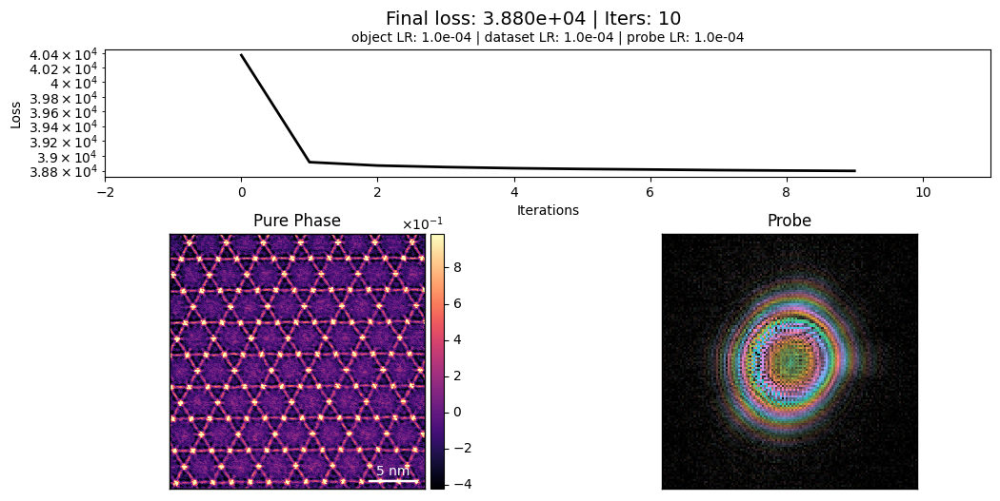

In [21]:
opt_params = {  
    "object": {
        "type": "adam", 
        "lr": 1e-4, 
    },
    "probe": {
        "type": "adam",
        "lr": 1e-4, 
    },
    "dataset": {
        "type": "adam",
        "lr": 1e-4,
    },
}

scheduler_params = {
    "object": {
        "type": "plateau",
    },
    "probe": {
        "type": "plateau",
    },
}
constraints = {
    "object": {
        "identical_slices": True,
    },
}

ptycho_dip.reconstruct(
    num_iters=10,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints,
    batch_size=128,
    store_snapshots_every=1, 
).visualize()

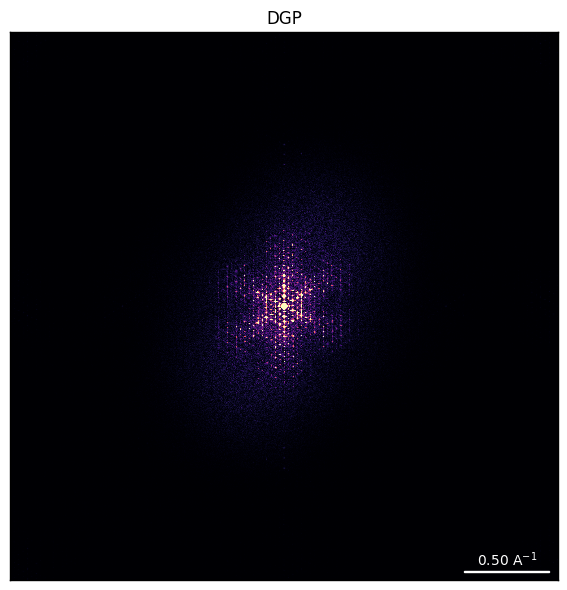

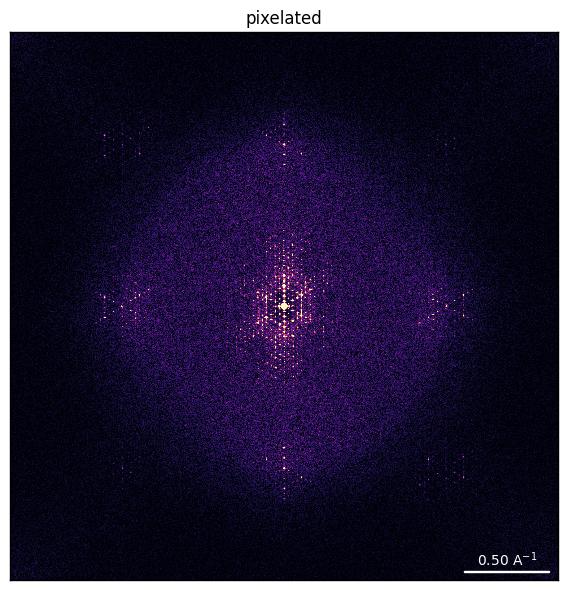

In [22]:
pad = (2048 - ptycho_dip.obj_cropped.shape[1]) // 2
dip_ff1 = ptycho_dip.show_obj_fft(
    cmap="magma",
    pad=pad,
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="DGP",
    axsize=(6, 6),
    return_fft=True,
)
pix_ff1 = ptycho_pix.show_obj_fft(
    cmap="magma",
    pad=pad,
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="pixelated",
    axsize=(6, 6),
    return_fft=True,
)


In [ ]:
ptycho_dip.reconstruct(
    num_iters=15,
).visualize()

  0%|          | 0/15 [00:00<?, ?it/s]

In [ ]:
ptycho_pix.save(
    "../data/MOSS6_DGP.zip",
    mode='o',
)

Saving ptychography object to /home/amccray/code/quantem-tutorials/notebooks/../data/MOSS6_DGP.zip


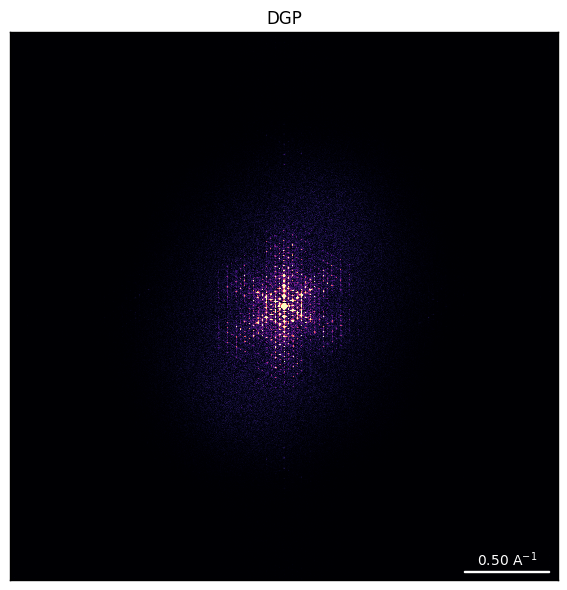

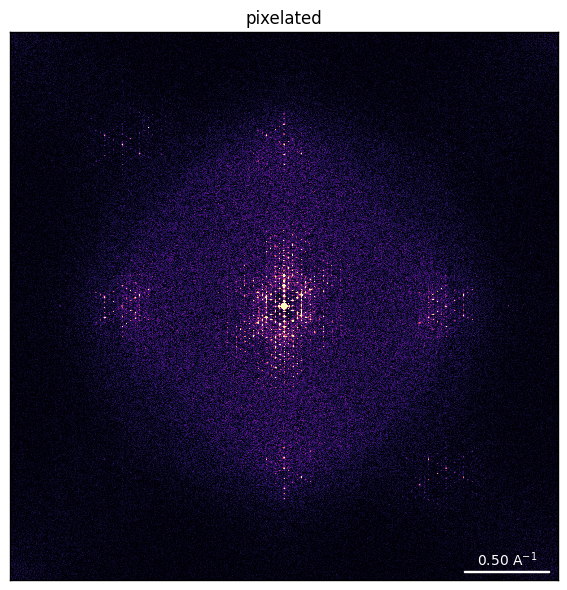

In [ ]:
pad = (2048 - ptycho_dip.obj_cropped.shape[1]) // 2
dip_ff1 = ptycho_dip.show_obj_fft(
    cmap="magma",
    pad=pad,
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="DGP",
    axsize=(6, 6),
    return_fft=True,
)
pix_ff1 = ptycho_pix.show_obj_fft(
    cmap="magma",
    pad=pad,
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="pixelated",
    axsize=(6, 6),
    return_fft=True,
)


(<Figure size 1000x1000 with 1 Axes>, <Axes: title={'center': 'pixelated'}>)

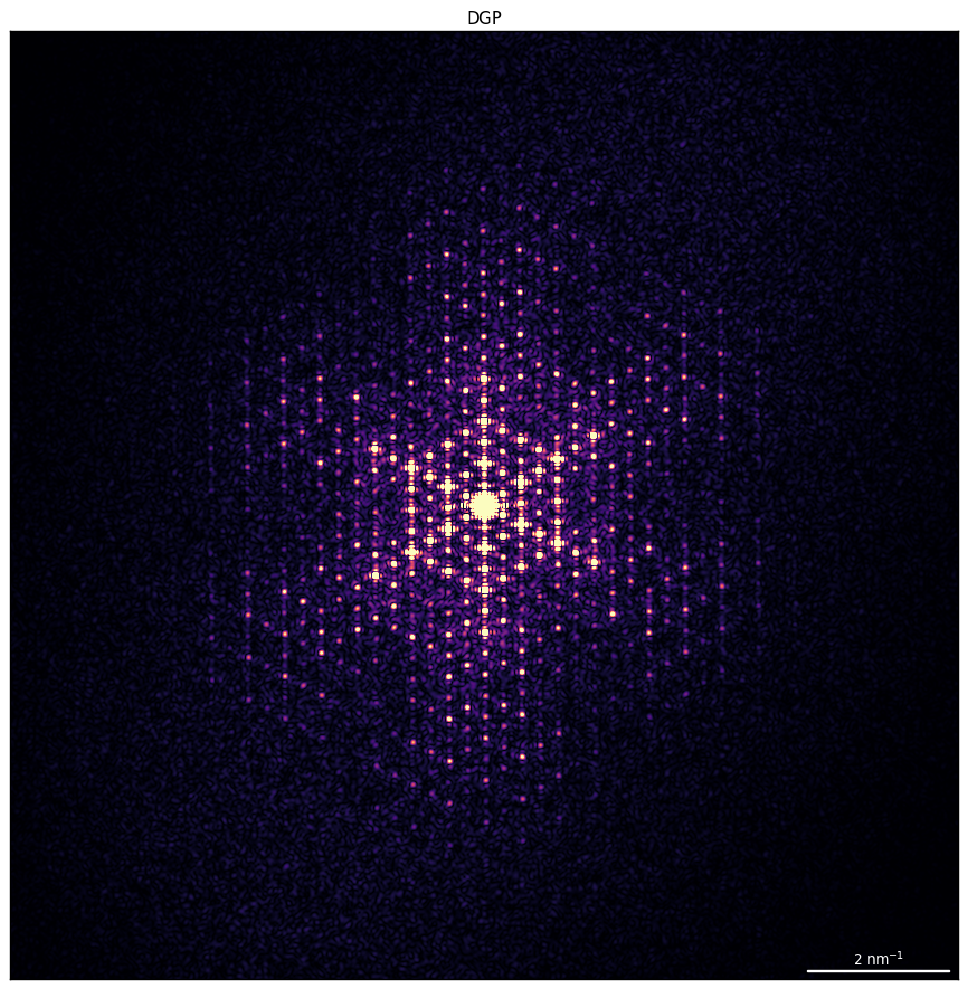

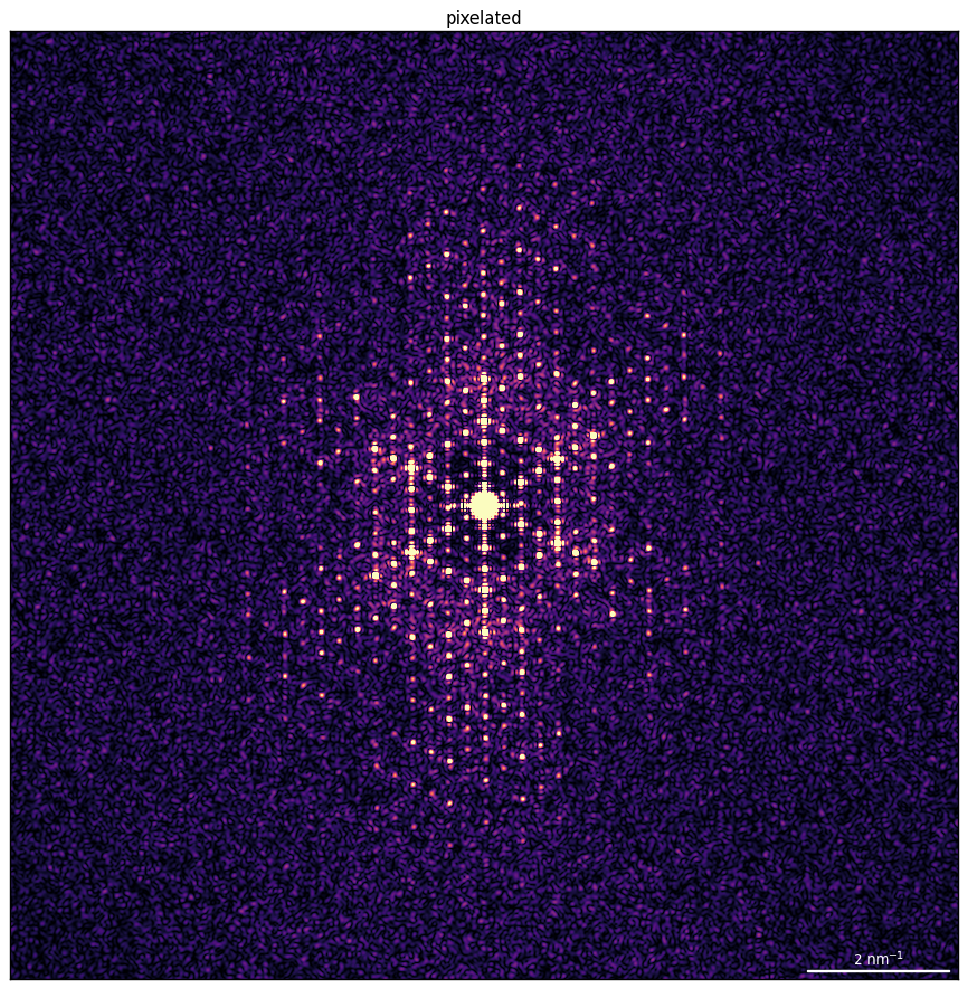

In [ ]:
c = 600
fft_sampling = 1 / (ptycho_dip.sampling[0] * dip_ff1.shape[0])
show_2d(
    np.abs(dip_ff1[c:-c,c:-c]),
    cmap='magma',
    axsize=(10,10),
    upper_quantile=0.995,
    title='DGP',
    scalebar=[{"sampling": fft_sampling*10, "units": r"$\mathrm{nm^{-1}}$"}],
)
show_2d(
    np.abs(pix_ff1[c:-c,c:-c]),
    cmap='magma',
    axsize=(10,10),
    upper_quantile=0.995,
    title='pixelated',
    scalebar=[{"sampling": fft_sampling*10, "units": r"$\mathrm{nm^{-1}}$"}],
)
